# MHD Assignment 1
Tim Heiszwolf 1242343

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import math

In [2]:
from Helpers import cylindricalToCartesian, cartesianToCylindrical, cylindricalCross, cylindricalInner, cylindricalAddition
from Helpers import BStar, gyrationTime, makePlot
from Helpers import BField3, EField3, EField5

# Question 1: algorithm
The full algorithm including equations can be found in the code. The equations can also be found here.

Orange block 1:

$r = \sqrt{(R - R_0)^2+Z^2}$

$\tau = \frac{q \Delta t}{2m}$

$\begin{pmatrix}E_R\\ E_\phi \\ E_Z\end{pmatrix} = \begin{pmatrix}E_0 (R-R_0)/r\\ 0 \\ E_0 Z/r\end{pmatrix}$ (code is modulair and can be replaced by any other function)

$\begin{pmatrix}V_{min,R}\\V_{min, \phi}\\V_{min, Z}\end{pmatrix} = \begin{pmatrix}V_R + \tau E_R\\V_\phi + \tau E_\phi\\ V_Z + \tau E_Z\end{pmatrix}$

$\begin{pmatrix}B_R\\ B_\phi\\ B_Z\end{pmatrix} = \begin{pmatrix}B_{p0} Z R_0/(r R)\\B_0 R_0/R\\ B_{p0}(R_0 - R)R_0/(r R)\end{pmatrix}$ (code is modulair and can be replaced by any other function)

$\begin{pmatrix}B^*_R\\ B^*_\phi\\ B^*_Z\end{pmatrix} =  \begin{pmatrix}B_R\\ B_\phi\\ B_Z+ m(1.5V_{\phi}-0.5V_{old, \phi})/(qR)\end{pmatrix}$

$c_1 = \frac{4}{4 + (B^*_R)^2+(B^*_\phi)^2+(B^*_Z)^2}$

$c_2 = 2 c_1 - 1$

$c_3 = 0.5c_1 (V_{min,R} B^*_R+V_{min,\phi} B^*_\phi+V_{min,Z} B^*_Z)$

$\begin{pmatrix}part1_R\\part1_\phi\\part1_Z\end{pmatrix} = \begin{pmatrix}c_1(v_{min,\phi} B^*_{Z} - v_{min,Z} B^*_{\phi})\\-c_1(v_{min,R} B^*_{Z} - v_{min,Z} B^*_{R})\\c_1(v_{min,R} B^*_{\phi} - v_{min,\phi} B^*_{R})\end{pmatrix}$

$\begin{pmatrix}part2_R\\part2_\phi\\part2_Z\end{pmatrix} = \begin{pmatrix}c_2 V_{min,R} + c_3 B^*_{R}\\c_2 V_{min,\phi} + c_3 B^*_{\phi}\\c_2 V_{min,Z} + c_3 B^*_{Z}\end{pmatrix}$

$\begin{pmatrix}V_{plus, R}\\V_{plus,\phi}\\V_{plus,Z}\end{pmatrix} = \begin{pmatrix}part1_{R} + part2_{R}\\part1_{\phi} + part2_{\phi}\\part1_{Z} + part2_{Z}\end{pmatrix}$

$\begin{pmatrix}V_{old,R}\\V_{old, \phi}\\V_{old, Z}\end{pmatrix} = \begin{pmatrix}V_R\\V_\phi\\ V_Z\end{pmatrix}$

$\begin{pmatrix}V_{R}\\V_{\phi}\\V_{Z}\end{pmatrix} = \begin{pmatrix}V_{plus,R} + \tau E_R\\V_{plus,\phi} + \tau E_\phi\\ V_{plus,Z} + \tau E_Z\end{pmatrix}$

Orange block 2:

$R_{old} = R$

$\begin{pmatrix}R\\ \phi \\ Z\end{pmatrix} = \begin{pmatrix}R+\Delta t V_R\\ \phi+\Delta t V_\phi/(0.5R + 0.5R_{old}) \\ Z +\Delta t V_Z\end{pmatrix}$ (the  $0.5R + 0.5R_{old}$ is due to the fact that $V_R$ is the velocity in between the current and next step, to approximate the value of $R$ there a average is used for small time steps this is very accurate)

In [3]:
class Simulation:
    def __init__(self, RStart, phiStart, ZStart, VRStart, VphiStart, VZStart, m, q, BField, EField, dt, R0, B0=5, Bp0=1, E0=0, Ep0=0):
        self.R = RStart
        self.phi = phiStart
        self.Z = ZStart
        self.VR = VRStart
        self.Vphi = VphiStart
        self.VZ = VZStart
        self.VROld = VRStart
        self.VphiOld = VphiStart
        self.VZOld = VZStart
        self.m = m
        self.q = q

        self.R0 = R0
        self.B0 = B0
        self.Bp0 = Bp0
        self.E0 = E0
        self.Ep0 = Ep0

        self.BField = BField
        self.EField = EField

        self.dt = dt
        self.i = 0

        self.data = {"R":[self.R], "phi":[self.phi], "Z":[self.Z]}
    
    def doTick(self):
        self.nextVelocity()
        self.nextPosition()
        
        self.data["R"].append(self.R)
        self.data["phi"].append(self.phi)
        self.data["Z"].append(self.Z)
        self.i = self.i + 1
    
    def nextVelocity(self):
        """
        Equivalent to the first orange block.
        """
        tau = 0.5 * self.q * self.dt / self.m
        
        ER, Ephi, EZ = self.EField(self.R, self.phi, self.Z, self.R0, self.E0, self.Ep0)
        
        VminR = self.VR + tau * ER
        Vminphi = self.Vphi + tau * Ephi
        VminZ = self.VZ + tau * EZ
        
        BR, Bphi, BZ = self.BField(self.R, self.phi, self.Z, self.R0, self.B0, self.Bp0)
        BStarR, BStarphi, BStarZ = BStar(BR, Bphi, BZ, self.R, self.q, self.dt, self.m, self.Vphi, self.VphiOld)
        c1 = 4/(4 + BStarR**2 + BStarZ**2 + BStarphi**2)
        c2 = 2 * c1 - 1
        c3 = 0.5 * c1 * (VminR * BStarR + Vminphi * BStarphi + VminZ * BStarZ)#cylindricalInner(VminR, Vminphi, VminZ, BStarR, BStarphi, BStarZ)
        
        part1R, part1phi, part1Z = cylindricalCross(c1 * VminR, c1 * Vminphi, c1 * VminZ, BStarR, BStarphi, BStarZ)
        part2R = c2 * VminR + c3 * BStarR
        part2phi = c2 * Vminphi + c3 * BStarphi
        part2Z = c2 * VminZ + c3 * BStarZ
        
        VplusR = part1R + part2R
        Vplusphi = part1phi + part2phi
        VplusZ = part1Z + part2Z
        
        self.VROld = self.VR
        self.VphiOld = self.Vphi
        self.VZOld = self.VZ
        
        self.VR = VplusR + tau * ER
        self.Vphi = Vplusphi + tau * Ephi
        self.VZ = VplusZ + tau * EZ
        
    def nextPosition(self):
        """
        Equivalent to the second orange block
        """
        ROld = self.R
        
        self.R = self.R + self.VR * self.dt
        self.phi = self.phi + self.Vphi * self.dt / (0.5 * self.R + 0.5 * ROld)
        self.Z = self.Z + self.VZ * self.dt
        
    def doSimulation(self, endTime):
        
        while self.i * self.dt < endTime:
            self.doTick()     

# Question 2: parameter determination
The gyration frequency of the alpha particle is approximately $38.4$ MHz and it has a velocity of approximately $13\cdot10^7$ meter per second. This results in a gyro-radius of around $5$ centimeter.

In [4]:
m = 4 * 1.660539 * (10**-27)# Kilogram
E = 3.5 * 1.602 * (10**(-19+6))# Joule
B = 5# Tesla
Z = 2
q = Z * 1.602 * (10**-19)# Coulomb
startVelocity = np.sqrt(2 * E / m)# Meter per second https://www.wolframalpha.com/input?i=velocity+alpha+particle+3.5+MeV
print("Gyration frequency:", 1/gyrationTime(m, B, Z)/10**6, "MHz.")
print("Velocity:", startVelocity, "meter per second.")
print("Gyro-radius:", m * startVelocity / (q * B)*100, "centimeter.")

Gyration frequency: 38.386063024297584 MHz.
Velocity: 12993487.716402989 meter per second.
Gyro-radius: 5.387314132111886 centimeter.


# Question 3: particle one
Below the results of the first simple simulation can be seen. A short simulation with one poloidal revolution can first be seen. Afterwards a simulation with many revolutions can be seen.

Simulated 3.1024677625126545e-06 seconds, with dt = 1.277261326682855e-09 and 2429 time steps


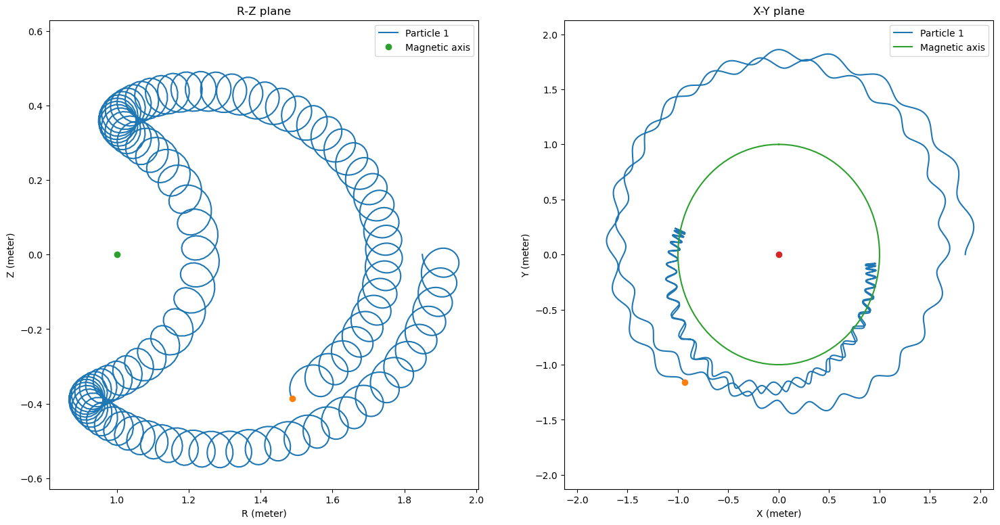

In [5]:
m = 4 * 1.660539 * (10**-27)# Kilogram
q = 2 * 1.602 * (10**-19)# Coulomb
R0 = 1# Meter
B0 = 5# Tesla
Bp0 = 1# Tesla
E0 = 0*10**3# Volt/Meter

RStart1 = 1.85 * R0# Meter
phiStart1 = 0# Radians
ZStart1 = 0# Meter
VRStart1 = 0# Meter per secon
VphiStart1 = 0.8 * startVelocity# Meter per second# Huh wacht klopt dit wel? Is het niet 
VZStart1 = -0.6 * startVelocity# Meter/Second

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.05 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1.doSimulation(3.1*10**-6)

print("Simulated", dt * len(particle1.data["R"]),"seconds, with dt =", dt, "and", len(particle1.data["R"]),"time steps")
fig, ax1, ax2 = makePlot([particle1.data], R0, AXReturn=True)
fig.savefig('Figures/Particle1SingleOrbit.pdf', dpi=1200)

Simulated 3.0001591302453578e-05 seconds, with dt = 1.277261326682855e-09 and 23489 time steps


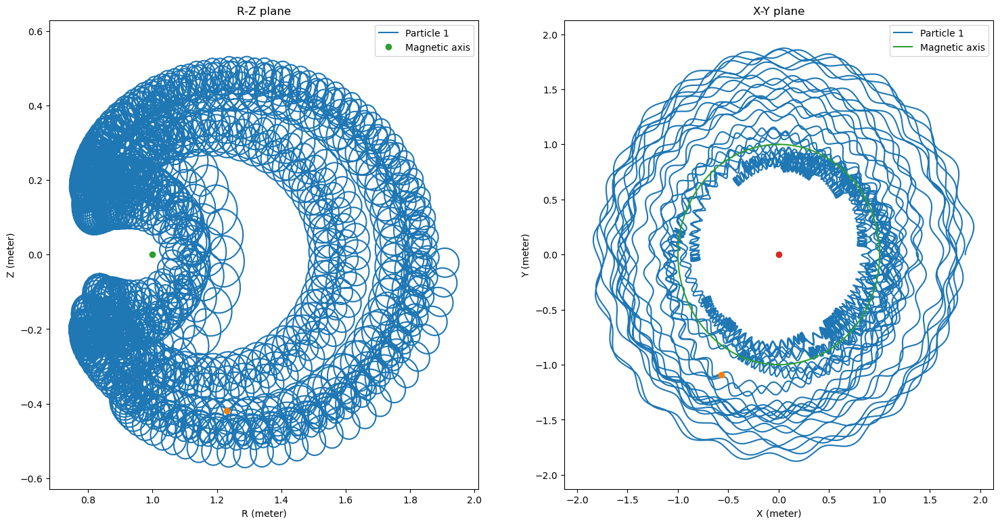

In [6]:
dt = 0.05 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1.doSimulation(3*10**-5)

print("Simulated", dt * len(particle1.data["R"]),"seconds, with dt =", dt, "and", len(particle1.data["R"]),"time steps")
fig, ax1, ax2 = makePlot([particle1.data], R0, AXReturn=True)
fig.savefig('Figures/Particle1ManyOrbits.pdf', dpi=1200)

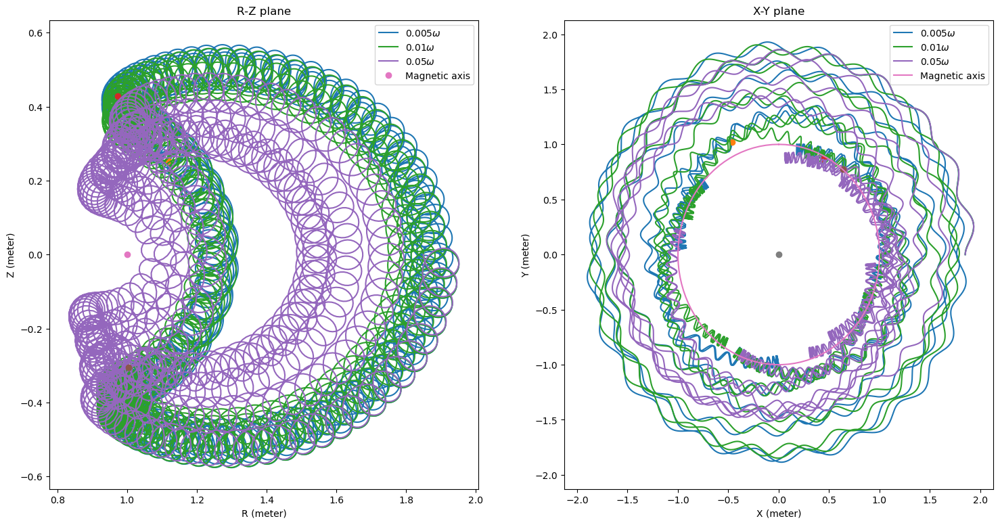

In [7]:
dt = 0.005 * gyrationTime(m, B)# Seconds
particleL0 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particleL0.doSimulation(1*10**-5)

dt = 0.01 * gyrationTime(m, B)# Seconds
particleL1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particleL1.doSimulation(1*10**-5)

dt = 0.05 * gyrationTime(m, B)# Seconds
particleL2 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particleL2.doSimulation(10**-5)

makePlot([particleL0.data, particleL1.data, particleL2.data], R0, ["0.005$\omega$", "0.01$\omega$", "0.05$\omega$"])

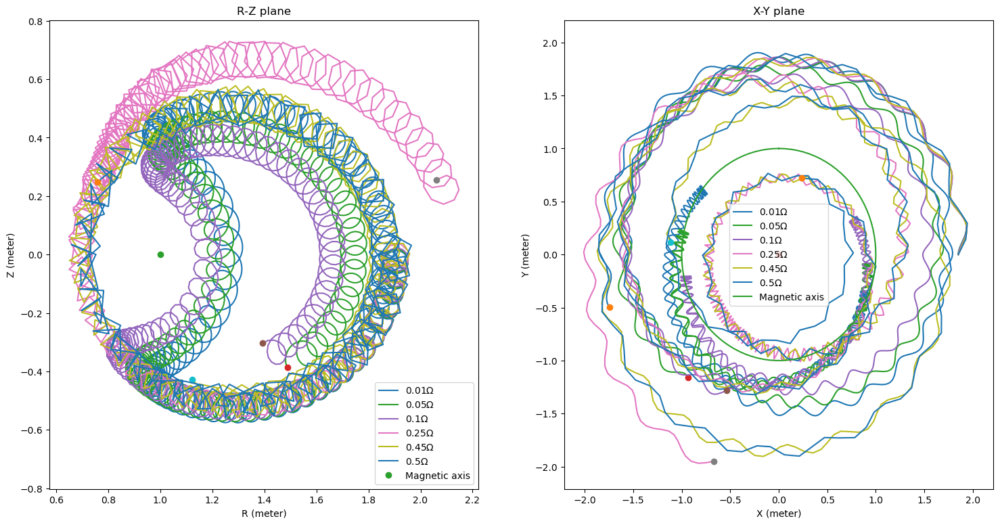

In [8]:
dt = 0.01 * gyrationTime(m, B)# Seconds
particle0 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle0.doSimulation(3.1*10**-6)

dt = 0.05 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1.doSimulation(3.1*10**-6)

dt = 0.1 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle2.doSimulation(3.1*10**-6)

dt = 0.25 * gyrationTime(m, B)# Seconds
particle3 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle3.doSimulation(3.1*10**-6)

dt = 0.3 * gyrationTime(m, B)# Seconds
particle4 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle4.doSimulation(3.1*10**-6)

dt = 0.5 * gyrationTime(m, B)# Seconds
particle5 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle5.doSimulation(3.1*10**-6)

makePlot([particle0.data, particle1.data, particle2.data, particle3.data, particle4.data, particle5.data], R0, ["0.01$\Omega$", "0.05$\Omega$", "0.1$\Omega$", "0.25$\Omega$", "0.45$\Omega$", "0.5$\Omega$"])

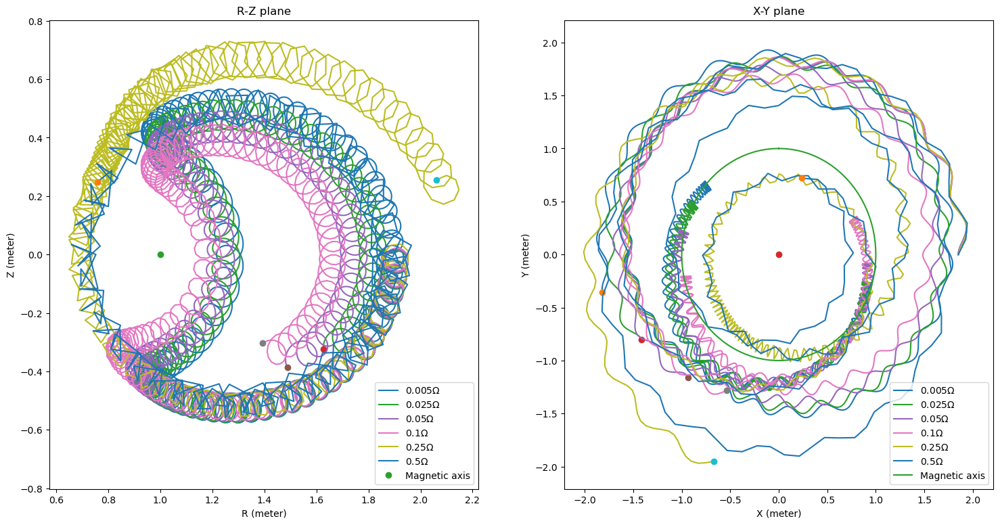

In [9]:
dt = 0.005 * gyrationTime(m, B)# Seconds
particle0 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle0.doSimulation(3.1*10**-6)

dt = 0.01 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1.doSimulation(3.1*10**-6)

dt = 0.025 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle2.doSimulation(3.1*10**-6)

dt = 0.05 * gyrationTime(m, B)# Seconds
particle3 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle3.doSimulation(3.1*10**-6)

dt = 0.1 * gyrationTime(m, B)# Seconds
particle4 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle4.doSimulation(3.1*10**-6)

dt = 0.25 * gyrationTime(m, B)# Seconds
particle5 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle5.doSimulation(3.1*10**-6)

dt = 0.5 * gyrationTime(m, B)# Seconds
particle6 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle6.doSimulation(3.1*10**-6)

#fig, ax1, ax2 = makePlot([particle0.data, particle1.data, particle2.data, particle3.data, particle4.data, particle5.data], R0, ["0.005$\Omega$", "0.01$\Omega$", "0.025$\Omega$", "0.05$\Omega$", "0.1$\Omega$", "0.25$\Omega$"], AXReturn=True)
#fig, ax1, ax2 = makePlot([particle0.data, particle2.data, particle3.data, particle4.data, particle5.data], R0, ["0.005$\Omega$", "0.025$\Omega$", "0.05$\Omega$", "0.1$\Omega$", "0.25$\Omega$"], AXReturn=True)
fig, ax1, ax2 = makePlot([particle0.data, particle2.data, particle3.data, particle4.data, particle5.data, particle6.data], R0, ["0.005$\Omega$", "0.025$\Omega$", "0.05$\Omega$", "0.1$\Omega$", "0.25$\Omega$", "0.5$\Omega$"], AXReturn=True)
fig.savefig('Figures/Particle1TimeStepsInvestigation.pdf', dpi=1200)

# Question 4: particle 2
A second particle is added. The results can be seen in the figure below. The starting position of the particle is already closer  to the magnetic axis than the closest point of the first particle. This results in a smaller and closer banana.

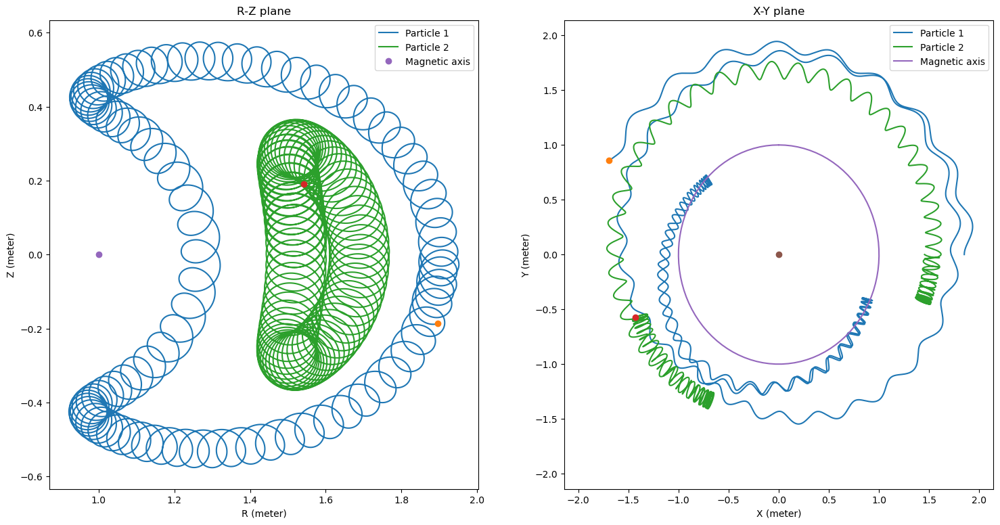

In [10]:
m = 4 * 1.660539 * (10**-27)# Kilogram
q = 2 * 1.602 * (10**-19)# Coulomb
R0 = 1# Meter
B0 = 5# Tesla
Bp0 = 1# Tesla
E0 = 0*10**3# Volt/Meter

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)

RStart2 = 1.454 * R0# Meter
phiStart2 = 0# Radians
ZStart2 = 0# Meter
VRStart2 = 0.48 * startVelocity# Meter per secon
VphiStart2 = -0.36 * startVelocity# Meter per second# Huh wacht klopt dit wel? Is het niet 
VZStart2 = -0.8 * startVelocity# Meter/Second

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)

particle1.doSimulation(3*10**-6)
particle2.doSimulation(3*10**-6)
fig, ax1, ax2 = makePlot([particle1.data, particle2.data], R0, AXReturn=True)
fig.savefig('Figures/Particle2and1.pdf', dpi=1200)

In [11]:
def getPerpendicular(vector, perPendicularTo):
    paralel = np.dot(vector, perPendicularTo)/np.dot(perPendicularTo, perPendicularTo)*perPendicularTo
    return vector - paralel, paralel

def lengthVector(vector):
    return np.sqrt(np.dot(vector, vector))

In [12]:

r = np.sqrt((RStart1 - R0)**2 + ZStart1**2)
Bpol = Bp0*R0/RStart1
BR, Bphi, BZ = BField3(RStart1, phiStart1, ZStart1, R0, B0, Bp0)
vper, vpar = getPerpendicular(np.array([VRStart1, VphiStart1, VZStart1]), np.array([BR, Bphi, BZ]))
pc = m * np.sqrt(VRStart1**2+VphiStart1**2+VZStart1**2) / (q * B)

deltar = 2*m*np.sqrt(np.dot(vper, vper))/q*Bpol
deltarmax = 2*np.sqrt(2*r/R0)*(B/Bpol)*pc
print("Particle 1 (width and max width)", deltar, deltarmax)
print("Particle 1 vpar/vper, vpar, vper", lengthVector(vpar)/lengthVector(vper), lengthVector(vpar), lengthVector(vper))
print("Sqrt(Bmax/bmin-1)",np.sqrt(lengthVector(BField3(min(particle1.data["R"]), phiStart1, ZStart1, R0, B0, Bp0))/lengthVector(BField3(max(particle1.data["R"]), phiStart1, ZStart1, R0, B0, Bp0))-1))

r = np.sqrt((RStart2 - R0)**2 + ZStart2**2)
Bpol = Bp0*R0/RStart2
BR, Bphi, BZ = BField3(RStart2, phiStart2, ZStart2, R0, B0, Bp0)
vper, vpar = getPerpendicular(np.array([VRStart2, VphiStart2, VZStart2]), np.array([BR, Bphi, BZ]))
pc = m * np.sqrt(VRStart2**2+VphiStart2**2+VZStart2**2) / (q * B)

deltar = 2*m*np.sqrt(np.dot(vper, vper))/q*Bpol
deltarmax = 2*np.sqrt(2*r/R0)*(B/Bpol)*pc
print("Particle 2 (width and max width)", deltar, deltarmax)
print("Particle 2 vpar/vper, vpar, vper", lengthVector(vpar)/lengthVector(vper), lengthVector(vpar), lengthVector(vper))
print("Sqrt(Bmax/bmin-1)",np.sqrt(lengthVector(BField3(min(particle2.data["R"]), phiStart2, ZStart2, R0, B0, Bp0))/lengthVector(BField3(max(particle2.data["R"]), phiStart2, ZStart2, R0, B0, Bp0))-1))

Particle 1 (width and max width) 0.125642502594769 1.299476676162903
Particle 1 vpar/vper, vpar, vper 2.090909090909091 11721869.927369544 5606111.70439413
Sqrt(Bmax/bmin-1) 1.0569496484616618
Particle 2 (width and max width) 0.36332160466475344 0.7464137490912283
Particle 2 vpar/vper, vpar, vper 0.19999999999999996 2548232.592906422 12741162.964532113
Sqrt(Bmax/bmin-1) 0.4964038049814589


# Question 5: electric fields
An electric field is added of 1000 kV/m (see the figure). This causes the orbits to move towards the outside of the tokamak. The effect is most pronounced in the "tips" of the bananas.

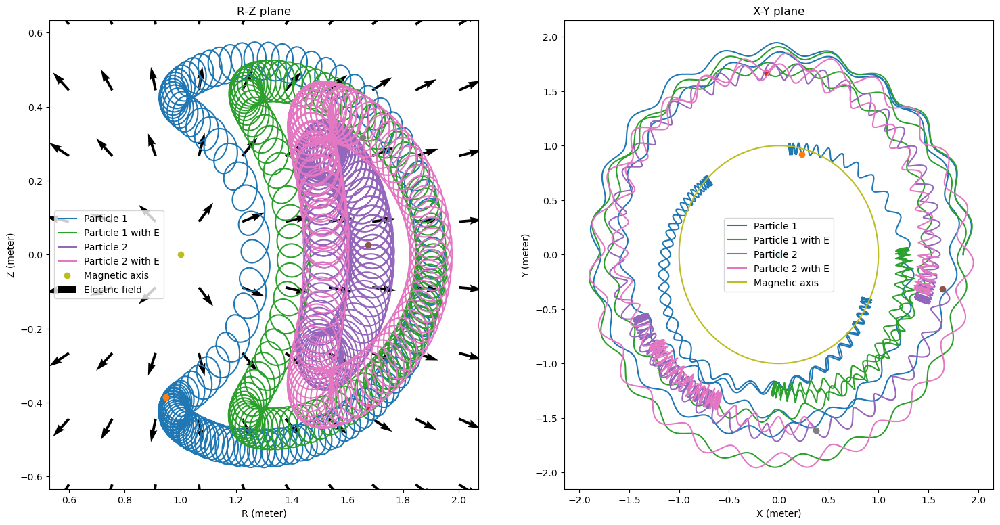

In [13]:
m = 4 * 1.660539 * (10**-27)# Kilogram
q = 2 * 1.602 * (10**-19)# Coulomb
R0 = 1# Meter
B0 = 5# Tesla
Bp0 = 1# Tesla
E0 = 1000*10**3# Volt/Meter

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1EField = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle2EField = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

particle1.doSimulation(4*10**-6)
particle1EField.doSimulation(4*10**-6)
particle2.doSimulation(4*10**-6)
particle2EField.doSimulation(4*10**-6)

R, Z = np.meshgrid(np.linspace(0.6, 2, 10), np.linspace(-0.8, 0.8, 10))
phi = 0
ER, Ephi, EZ = EField5(R, phi, Z, R0, E0)

fig, ax1, ax2 = makePlot([particle1.data, particle1EField.data, particle2.data, particle2EField.data], R0, ["Particle 1", "Particle 1 with E", "Particle 2", "Particle 2 with E"], AXReturn=True)
ax1.quiver(R, Z, ER, EZ, label="Electric field")
ax1.legend()
plt.show()
fig.savefig('Figures/EField1000KV.pdf', dpi=1200)

If only one particle is taken and the electric field is overlaid it becomes clear why (see figure). The electric field points radially away from the magnetic axis around which the banana forms. Since the electric effects of the Lorentz force are additive and the charge of the particle is positive this means that (besides the complex magnetic forces) the particle constantly gets pushed to the outside.

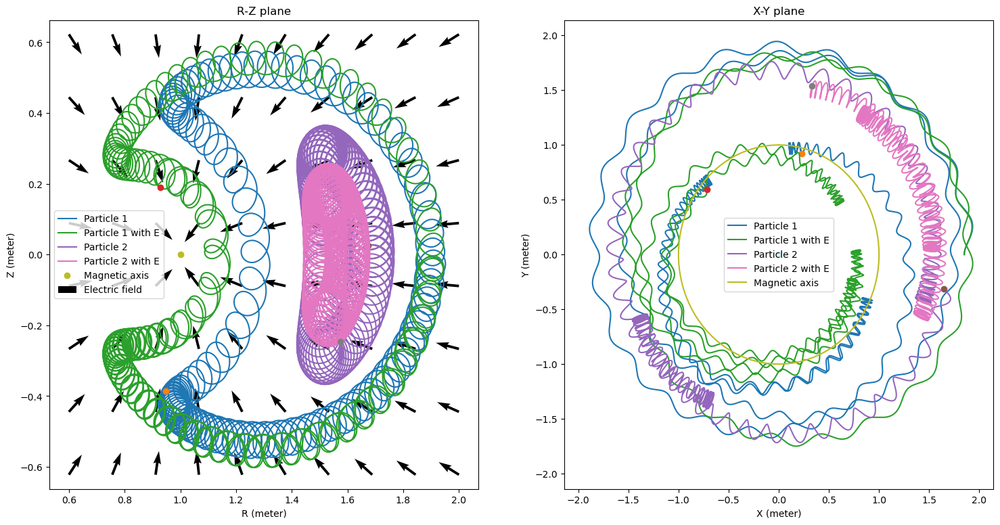

In [14]:
m = 4 * 1.660539 * (10**-27)# Kilogram
q = 2 * 1.602 * (10**-19)# Coulomb
R0 = 1# Meter
B0 = 5# Tesla
Bp0 = 1# Tesla
E0 = -1000*10**3# Volt/Meter

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1EField = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle2EField = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

particle1.doSimulation(4*10**-6)
particle1EField.doSimulation(4*10**-6)
particle2.doSimulation(4*10**-6)
particle2EField.doSimulation(4*10**-6)

R, Z = np.meshgrid(np.linspace(0.6, 2, 10), np.linspace(-0.8, 0.8, 10))
phi = 0
ER, Ephi, EZ = EField5(R, phi, Z, R0, E0)

fig, ax1, ax2 = makePlot([particle1.data, particle1EField.data, particle2.data, particle2EField.data], R0, ["Particle 1", "Particle 1 with E", "Particle 2", "Particle 2 with E"], AXReturn=True)
ax1.quiver(R, Z, ER, EZ, label="Electric field")
ax1.legend()
plt.show()
fig.savefig('Figures/EField-1000KV.pdf', dpi=1200)

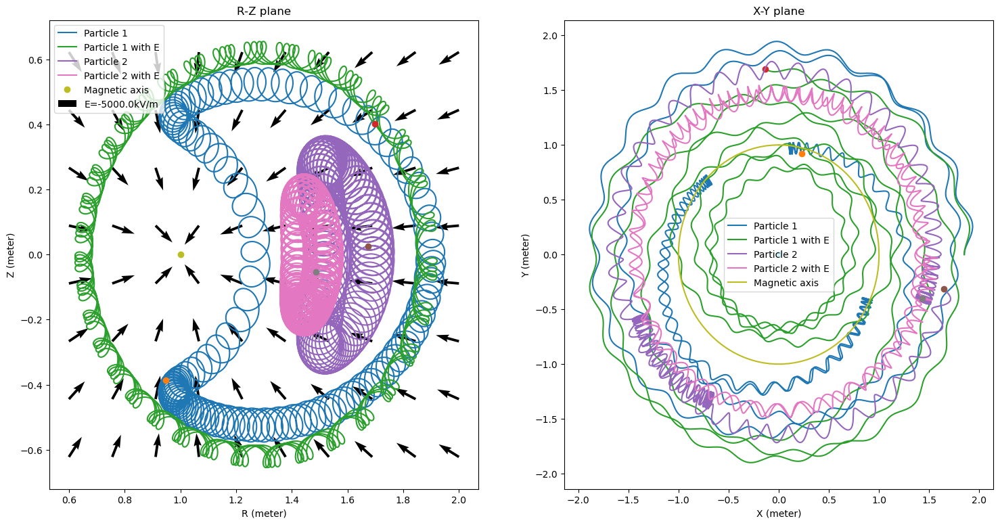

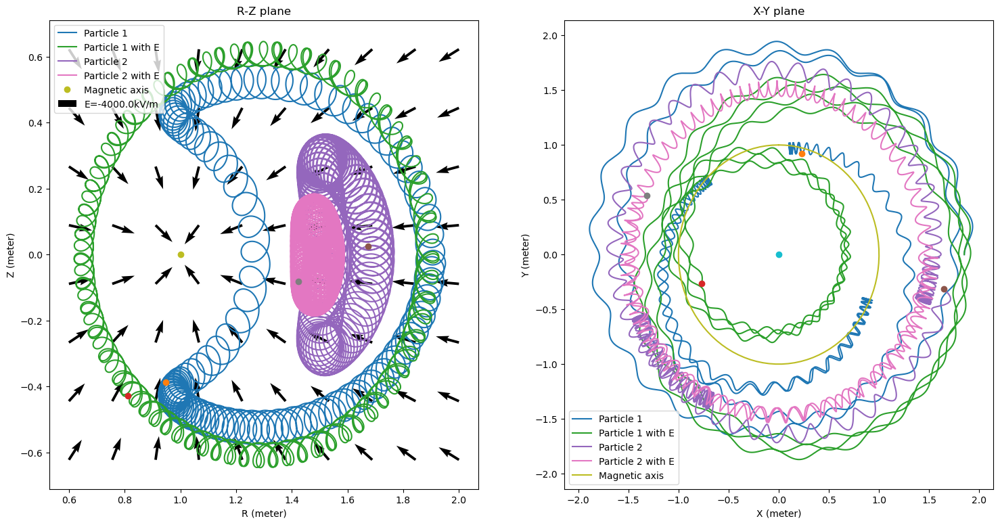

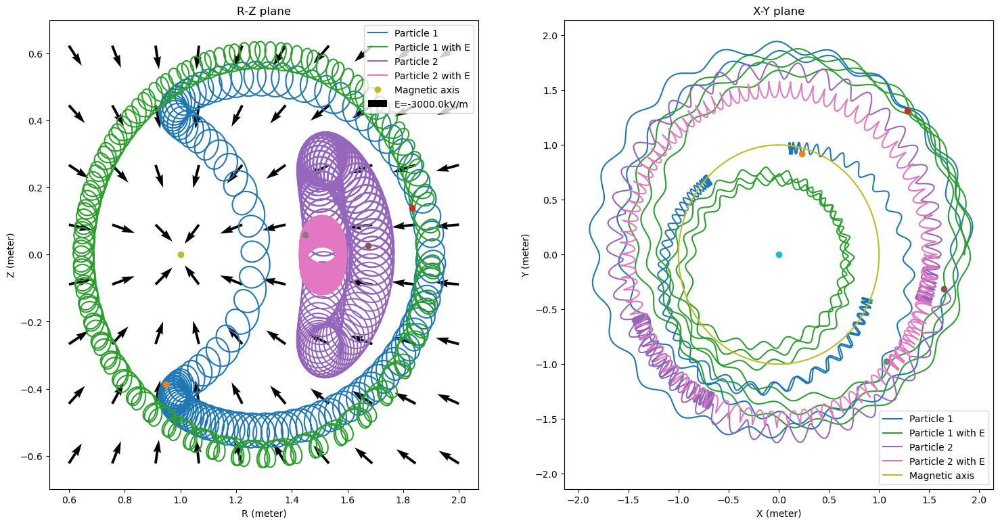

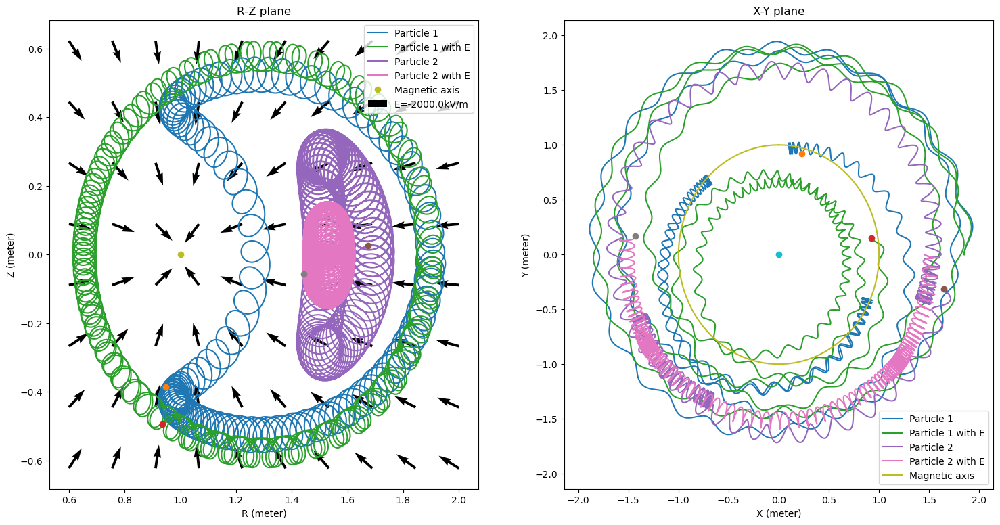

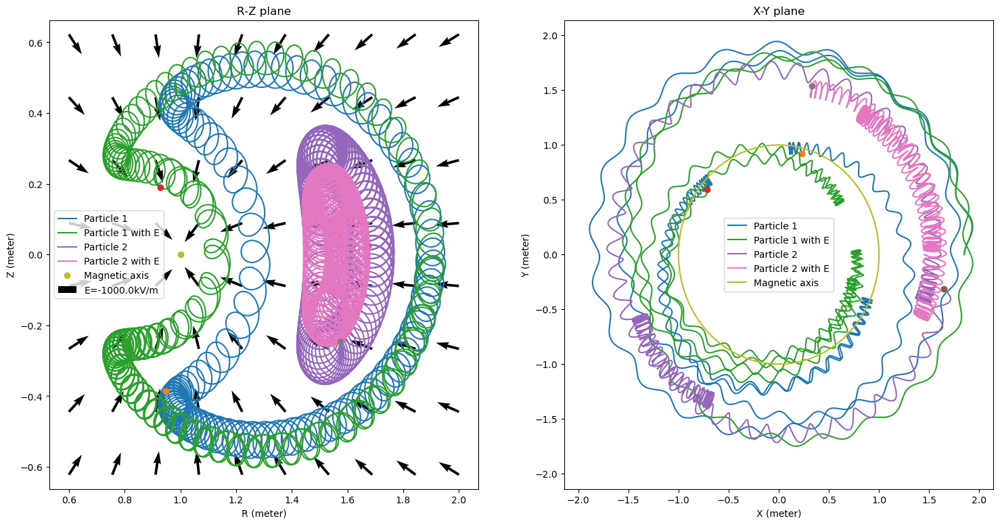

C:\Users\heisz\anaconda3\Lib\site-packages\matplotlib\quiver.py:645: RuntimeWarning: divide by zero encountered in scalar divide
  length = a * (widthu_per_lenu / (self.scale * self.width))
C:\Users\heisz\anaconda3\Lib\site-packages\matplotlib\quiver.py:645: RuntimeWarning: invalid value encountered in multiply
  length = a * (widthu_per_lenu / (self.scale * self.width))


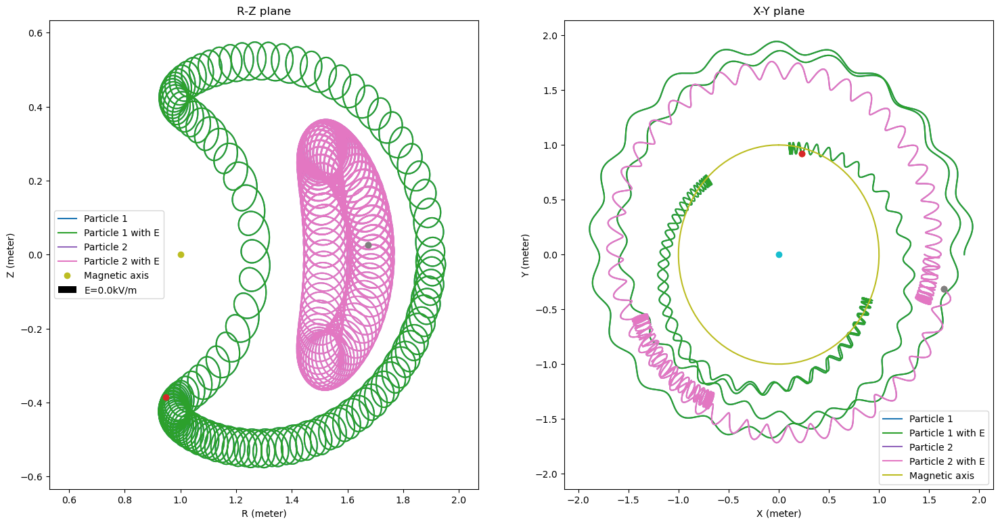

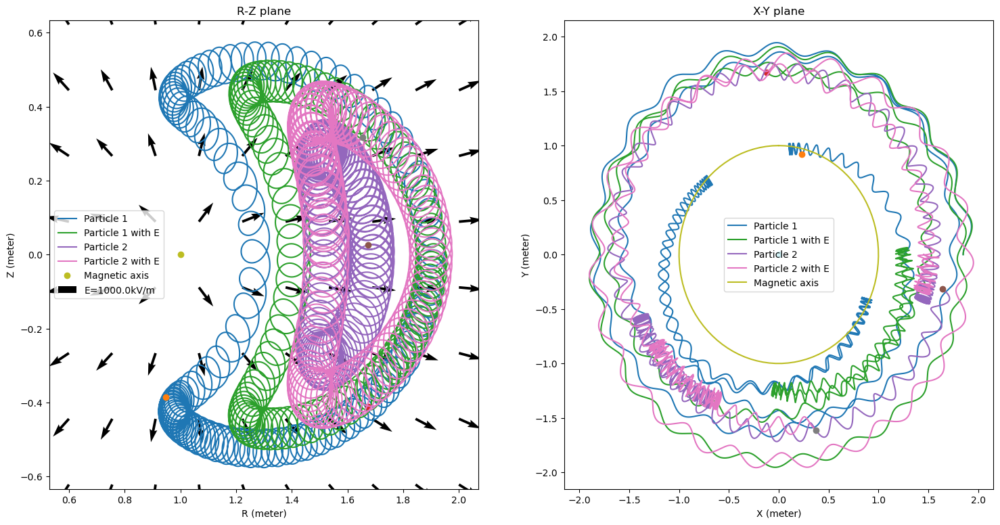

In [15]:

for i in range(-500, 155, 100):#(-500, 155, 10) THIS WAS THE ORIGINAL RANGE, WAS SHORTEND TO REDUCE FILESIZE FOR GITHUB
    m = 4 * 1.660539 * (10**-27)# Kilogram
    q = 2 * 1.602 * (10**-19)# Coulomb
    R0 = 1# Meter
    B0 = 5# Tesla
    Bp0 = 1# Tesla
    E0 = i*10*10**3# Volt/Meter
    
    B = np.sqrt(Bp0**2 + B0**2)
    dt = 0.001 * gyrationTime(m, B)# Seconds
    particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
    particle1EField = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)
    
    B = np.sqrt(Bp0**2 + B0**2)
    dt = 0.001 * gyrationTime(m, B)# Seconds
    particle2 = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
    particle2EField = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)
    
    particle1.doSimulation(4*10**-6)
    particle1EField.doSimulation(4*10**-6)
    particle2.doSimulation(4*10**-6)
    particle2EField.doSimulation(4*10**-6)
    
    R, Z = np.meshgrid(np.linspace(0.6, 2, 10), np.linspace(-0.8, 0.8, 10))
    phi = 0
    ER, Ephi, EZ = EField5(R, phi, Z, R0, E0)
    
    fig, ax1, ax2 = makePlot([particle1.data, particle1EField.data, particle2.data, particle2EField.data], R0, ["Particle 1", "Particle 1 with E", "Particle 2", "Particle 2 with E"], AXReturn=True)
    ax1.quiver(R, Z, ER, EZ, label="E="+str(E0/1000)+"kV/m")
    ax1.legend()
    plt.show()

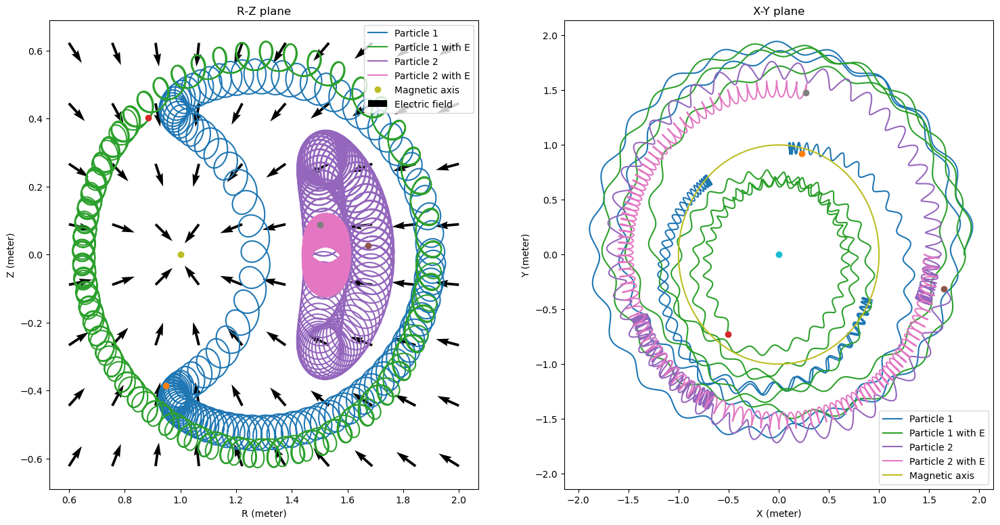

In [16]:
m = 4 * 1.660539 * (10**-27)# Kilogram
q = 2 * 1.602 * (10**-19)# Coulomb
R0 = 1# Meter
B0 = 5# Tesla
Bp0 = 1# Tesla
E0 = -2400*10**3# Volt/Meter

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1EField = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle2EField = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

particle1.doSimulation(4*10**-6)
particle1EField.doSimulation(4*10**-6)
particle2.doSimulation(4*10**-6)
particle2EField.doSimulation(4*10**-6)

R, Z = np.meshgrid(np.linspace(0.6, 2, 10), np.linspace(-0.8, 0.8, 10))
phi = 0
ER, Ephi, EZ = EField5(R, phi, Z, R0, E0)

fig, ax1, ax2 = makePlot([particle1.data, particle1EField.data, particle2.data, particle2EField.data], R0, ["Particle 1", "Particle 1 with E", "Particle 2", "Particle 2 with E"], AXReturn=True)
ax1.quiver(R, Z, ER, EZ, label="Electric field")
ax1.legend()
plt.show()
fig.savefig('Figures/EField-2400KV.pdf', dpi=1200)

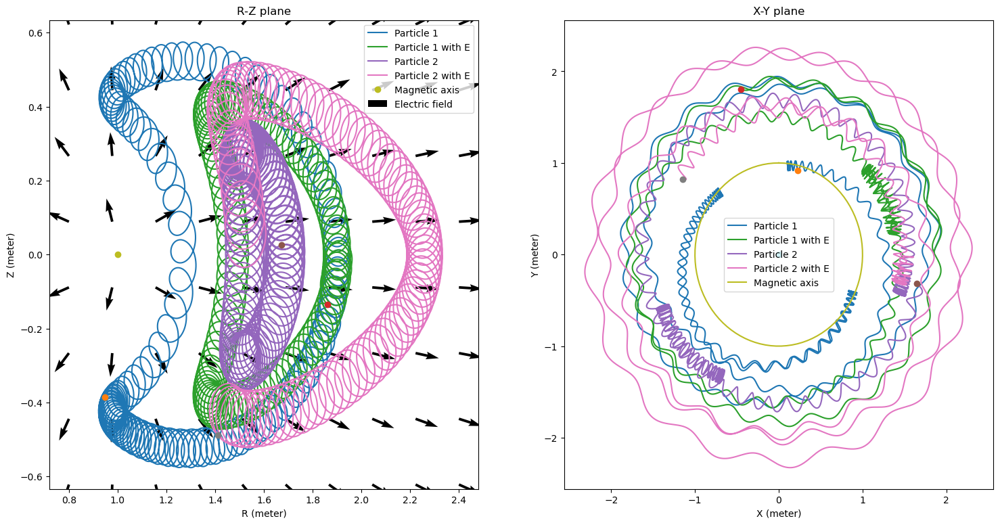

In [17]:
m = 4 * 1.660539 * (10**-27)# Kilogram
q = 2 * 1.602 * (10**-19)# Coulomb
R0 = 1# Meter
B0 = 5# Tesla
Bp0 = 1# Tesla
E0 = 1500*10**3# Volt/Meter

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle1EField = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.001 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)
particle2EField = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField5, dt, R0, B0, Bp0, E0)

particle1.doSimulation(4*10**-6)
particle1EField.doSimulation(4*10**-6)
particle2.doSimulation(4*10**-6)
particle2EField.doSimulation(4*10**-6)

R, Z = np.meshgrid(np.linspace(0.8, 2.4, 10), np.linspace(-0.8, 0.8, 10))
phi = 0
ER, Ephi, EZ = EField5(R, phi, Z, R0, E0)

fig, ax1, ax2 = makePlot([particle1.data, particle1EField.data, particle2.data, particle2EField.data], R0, ["Particle 1", "Particle 1 with E", "Particle 2", "Particle 2 with E"], AXReturn=True)
ax1.quiver(R, Z, ER, EZ, label="Electric field")
ax1.legend()
plt.show()
fig.savefig('Figures/EField1500KV.pdf', dpi=1200)

# Question 6: ITER
Below plots of a tokamak the size of ITER can be seen.

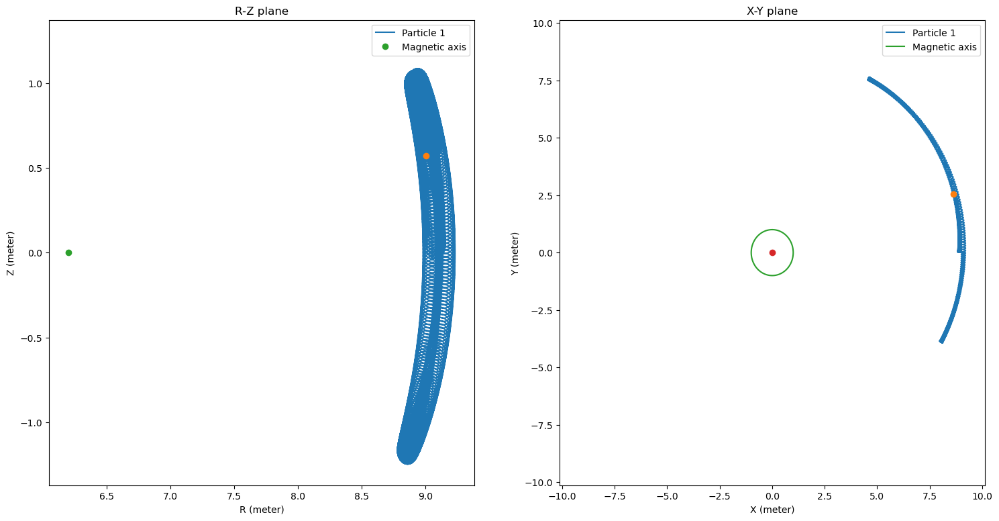

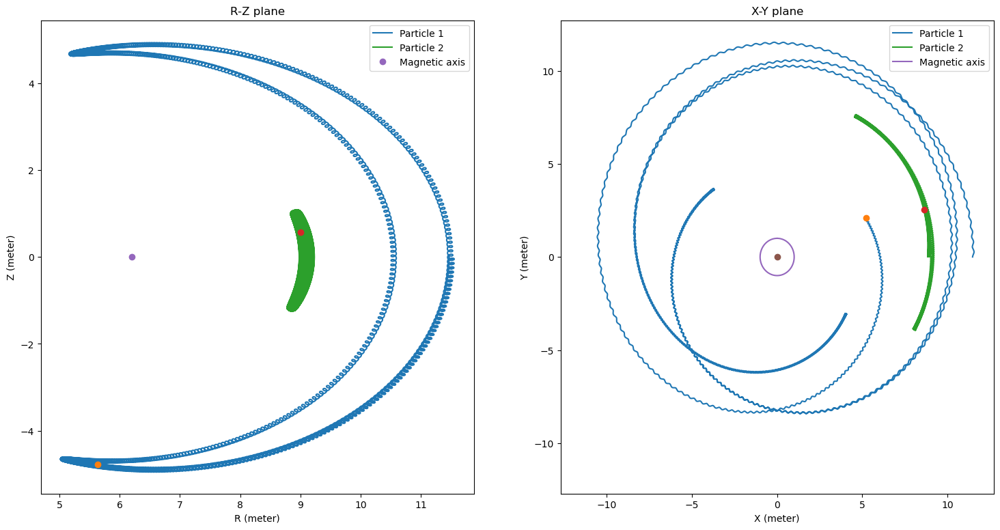

In [18]:
m = 4 * 1.660539 * (10**-27)# Kilogram
q = 2 * 1.602 * (10**-19)# Coulomb
R0 = 6.2# Meter
B0 = 5# Tesla
Bp0 = 1# Tesla
E0 = 0*10**3# Volt/Meter

RStart1 = 1.85 * R0# Meter
phiStart1 = 0# Radians
ZStart1 = 0# Meter
VRStart1 = 0# Meter per secon
VphiStart1 = 0.8 * startVelocity# Meter per second
VZStart1 = -0.6 * startVelocity# Meter/Second

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.01 * gyrationTime(m, B)# Seconds
particle1 = Simulation(RStart1, phiStart1, ZStart1, VRStart1, VphiStart1, VZStart1, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)

RStart2 = 1.454 * R0# Meter
phiStart2 = 0# Radians
ZStart2 = 0# Meter
VRStart2 = 0.48 * startVelocity# Meter per secon
VphiStart2 = -0.36 * startVelocity# Meter per second# Huh wacht klopt dit wel? Is het niet 
VZStart2 = -0.8 * startVelocity# Meter/Second

B = np.sqrt(Bp0**2 + B0**2)
dt = 0.01 * gyrationTime(m, B)# Seconds
particle2 = Simulation(RStart2, phiStart2, ZStart2, VRStart2, VphiStart2, VZStart2, m, q, BField3, EField3, dt, R0, B0, Bp0, E0)

particle1.doSimulation(2.5*10**-5)
particle2.doSimulation(1.75*10**-5)
#particle2.doSimulation(2.5*10**-5)
fig, ax1, ax2 = makePlot([particle2.data], R0, AXReturn=True)
fig.savefig('Figures/ITERSimulationParticle2.pdf', dpi=1200)
fig, ax1, ax2 = makePlot([particle1.data, particle2.data], R0, AXReturn=True)
fig.savefig('Figures/ITERSimulation.pdf', dpi=1200)